In [ ]:
! pip install mediapipe
import mediapipe as mp
import cv2
import glob
from PIL import Image
import numpy as np
import math
from google.colab.patches import cv2_imshow
mp_face_mesh = mp.solutions.face_mesh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 32.9 MB 1.3 MB/s 


In [ ]:
!unzip "40 images_2 data.zip"

Archive:  40 images_2 data.zip
   creating: 40 images_2 data/
   creating: 40 images_2 data/20 test images/
  inflating: 40 images_2 data/20 test images/heart (446).jpg  
  inflating: 40 images_2 data/20 test images/heart (726).jpg  
  inflating: 40 images_2 data/20 test images/heart (91).jpg  
  inflating: 40 images_2 data/20 test images/heart (995).jpg  
  inflating: 40 images_2 data/20 test images/oblong (280).jpg  
  inflating: 40 images_2 data/20 test images/oblong (315).jpg  
  inflating: 40 images_2 data/20 test images/oblong (684).jpg  
  inflating: 40 images_2 data/20 test images/oblong (8).jpg  
  inflating: 40 images_2 data/20 test images/oval (145).jpg  
  inflating: 40 images_2 data/20 test images/oval (288).jpg  
  inflating: 40 images_2 data/20 test images/oval (292).jpg  
  inflating: 40 images_2 data/20 test images/oval (686).jpg  
  inflating: 40 images_2 data/20 test images/round (354).jpg  
  inflating: 40 images_2 data/20 test images/round (4).jpg  
  inflating: 40

# làm gọn cho 1 hình

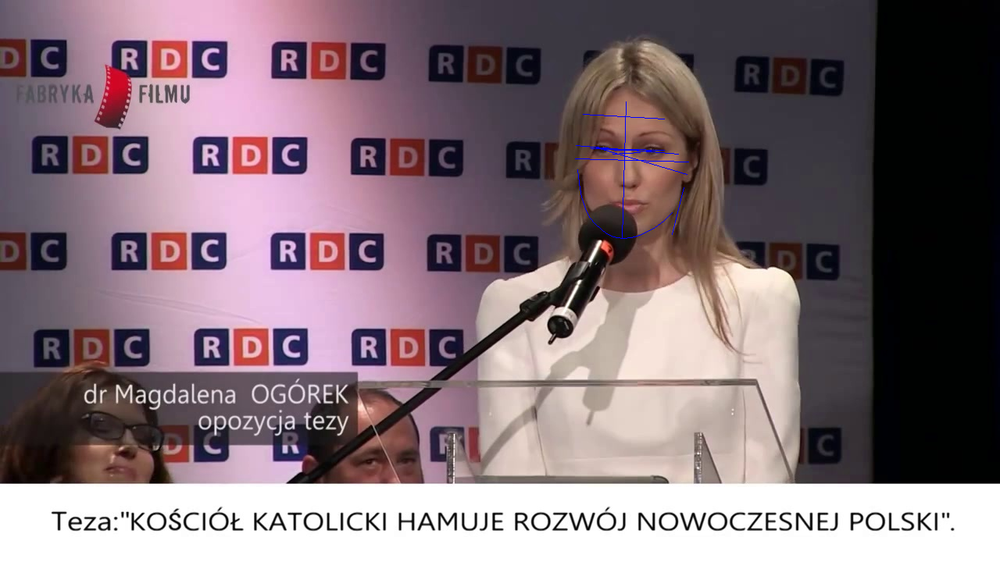

111.90097160067054


In [ ]:
import cv2
import mediapipe as mp

mp_face_mesh = mp.solutions.face_mesh
khanh=[]

with mp_face_mesh.FaceMesh(static_image_mode=True,max_num_faces=1,refine_landmarks=True,min_detection_confidence=0.5) as face_mesh:

    image = cv2.imread("40 images_2 data/cut frame from 20 vid/vid1_frame1.jpg")
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    w, h = image.shape[1], image.shape[0]

    face_landmarks = results.multi_face_landmarks

    #def function
    def take_landmark(num):
      results = [face_landmarks.landmark[num].x * w, face_landmarks.landmark[num].y * h,face_landmarks.landmark[num].z * w]
      return results

    def take_distance(num1,num2):
      distances = math.sqrt((face_landmarks.landmark[num1].x *w- face_landmarks.landmark[num2].x *w)**2 +(face_landmarks.landmark[num1].y *h- face_landmarks.landmark[num2].y*h)**2+(face_landmarks.landmark[num1].z*w- face_landmarks.landmark[num2].z*w)**2 )
      return distances

    def draw_line(num1,num2):
      color=(255, 0, 0)
      return cv2.line(image,(int(take_landmark(num1)[0]),int(take_landmark(num1)[1])),(int(take_landmark(num2)[0]),int(take_landmark(num2)[1])),color,1)

    if results.multi_face_landmarks is not None:
        for face_landmarks in results.multi_face_landmarks:
            khanh.append(face_landmarks)

    # Face Length: 152, 10
    facelength_l = take_landmark(152)
    facelength_r = take_landmark(10)
    facelength_distance = take_distance(152,10)

    ## Iris: 473, 468
    iris_l= take_landmark(473)
    iris_r= take_landmark(468)
    pd_distance=take_distance(473,468)

    ## FOREHEAD: 54, 333
    forehead_l= take_landmark(54)
    forehead_r= take_landmark(333)
    forehead_distance=take_distance(54,333)

    # JAWLINE: 58, 433
    jawline_l= take_landmark(58)
    jawline_r= take_landmark(433)
    jawline_distance=take_distance(58,433)

    # OUTER EYE: 130, 359
    outereye_l= take_landmark(130)
    outereye_r= take_landmark(359)
    outereye_distance=take_distance(130,359)

    #INNER EYE: 112, 362
    innereye_l= take_landmark(112)
    innereye_r= take_landmark(362)
    innereye_distance=take_distance(112,363)

    #CHEEKBONE: 227, 454
    cheekbone_l= take_landmark(227)
    cheekbone_r= take_landmark(454)
    cheekbone_distance1=take_distance(227,454)
    cheekbone_distance=take_distance(93,132)+take_distance(132,58)+take_distance(58,172)+take_distance(136,172)+take_distance(136,150)+take_distance(150,149)+take_distance(149,176)+take_distance(176,152)+take_distance(152,337)+take_distance(337,400)+take_distance(400,378)+take_distance(378,379)+take_distance(379,365)+take_distance(365,397)+take_distance(397,361)+take_distance(361,323)

    #TEMPLE WIDTH: 127, 372
    templewidth_l= take_landmark(127)
    templewidth_r= take_landmark(372)
    templewidth_distance=take_distance(127,372)

    for face_landmarks in results.multi_face_landmarks:
        #cv2.circle(annotated_image, ( int(forehead_left[0]),int(forehead_left[1]) ), 5, (255,255,0), -2)
        # draw LINE
        color=(255, 0, 0)
        cv2.line(image,(int(forehead_l[0]),int(forehead_l[1])),(int(forehead_r[0]),int(forehead_r[1])),color,1)
        cv2.line(image,(int(iris_l[0]),int(iris_l[1])),(int(iris_r[0]),int(iris_r[1])),color,1)
        cv2.line(image,(int(facelength_l[0]),int(facelength_l[1])),(int(facelength_r[0]),int(facelength_r[1])),color,1)
        cv2.line(image,(int(innereye_l[0]),int(innereye_l[1])),(int(innereye_r[0]),int(innereye_r[1])),color,1)
        cv2.line(image,(int(outereye_l[0]),int(outereye_l[1])),(int(outereye_r[0]),int(outereye_r[1])),color,1)
        cv2.line(image,(int(cheekbone_l[0]),int(cheekbone_l[1])),(int(cheekbone_r[0]),int(cheekbone_r[1])),color,1)
        cv2.line(image,(int(templewidth_l[0]),int(templewidth_l[1])),(int(templewidth_r[0]),int(templewidth_r[1])),color,1)

        cv2.line(image,(int(take_landmark(93)[0]),int(take_landmark(93)[1])),(int(take_landmark(132)[0]),int(take_landmark(132)[1])),color,1)
        cv2.line(image,(int(take_landmark(132)[0]),int(take_landmark(132)[1])),(int(take_landmark(58)[0]),int(take_landmark(58)[1])),color,1)
        cv2.line(image,(int(take_landmark(58)[0]),int(take_landmark(58)[1])),(int(take_landmark(172)[0]),int(take_landmark(172)[1])),color,1)
        cv2.line(image,(int(take_landmark(172)[0]),int(take_landmark(172)[1])),(int(take_landmark(136)[0]),int(take_landmark(136)[1])),color,1)
        cv2.line(image,(int(take_landmark(136)[0]),int(take_landmark(136)[1])),(int(take_landmark(150)[0]),int(take_landmark(150)[1])),color,1)
        cv2.line(image,(int(take_landmark(150)[0]),int(take_landmark(150)[1])),(int(take_landmark(149)[0]),int(take_landmark(149)[1])),color,1)
        cv2.line(image,(int(take_landmark(149)[0]),int(take_landmark(149)[1])),(int(take_landmark(176)[0]),int(take_landmark(176)[1])),color,1)
        cv2.line(image,(int(take_landmark(176)[0]),int(take_landmark(176)[1])),(int(take_landmark(148)[0]),int(take_landmark(148)[1])),color,1)
        cv2.line(image,(int(take_landmark(148)[0]),int(take_landmark(148)[1])),(int(take_landmark(152)[0]),int(take_landmark(152)[1])),color,1)
        cv2.line(image,(int(take_landmark(152)[0]),int(take_landmark(152)[1])),(int(take_landmark(377)[0]),int(take_landmark(377)[1])),color,1)
        cv2.line(image,(int(take_landmark(377)[0]),int(take_landmark(377)[1])),(int(take_landmark(400)[0]),int(take_landmark(400)[1])),color,1)
        cv2.line(image,(int(take_landmark(149)[0]),int(take_landmark(149)[1])),(int(take_landmark(176)[0]),int(take_landmark(176)[1])),color,1)
        cv2.line(image,(int(take_landmark(400)[0]),int(take_landmark(400)[1])),(int(take_landmark(378)[0]),int(take_landmark(378)[1])),color,1)
        cv2.line(image,(int(take_landmark(378)[0]),int(take_landmark(378)[1])),(int(take_landmark(379)[0]),int(take_landmark(379)[1])),color,1)
        cv2.line(image,(int(take_landmark(379)[0]),int(take_landmark(379)[1])),(int(take_landmark(365)[0]),int(take_landmark(365)[1])),color,1)
        cv2.line(image,(int(take_landmark(365)[0]),int(take_landmark(365)[1])),(int(take_landmark(397)[0]),int(take_landmark(397)[1])),color,1)
        cv2.line(image,(int(take_landmark(397)[0]),int(take_landmark(396)[1])),(int(take_landmark(361)[0]),int(take_landmark(361)[1])),color,1)
        cv2.line(image,(int(take_landmark(161)[0]),int(take_landmark(161)[1])),(int(take_landmark(323)[0]),int(take_landmark(323)[1])),color,1)


cv2_imshow( image)
cv2.waitKey(0)

# closing all open windows
cv2.destroyAllWindows()
print(forehead_distance)

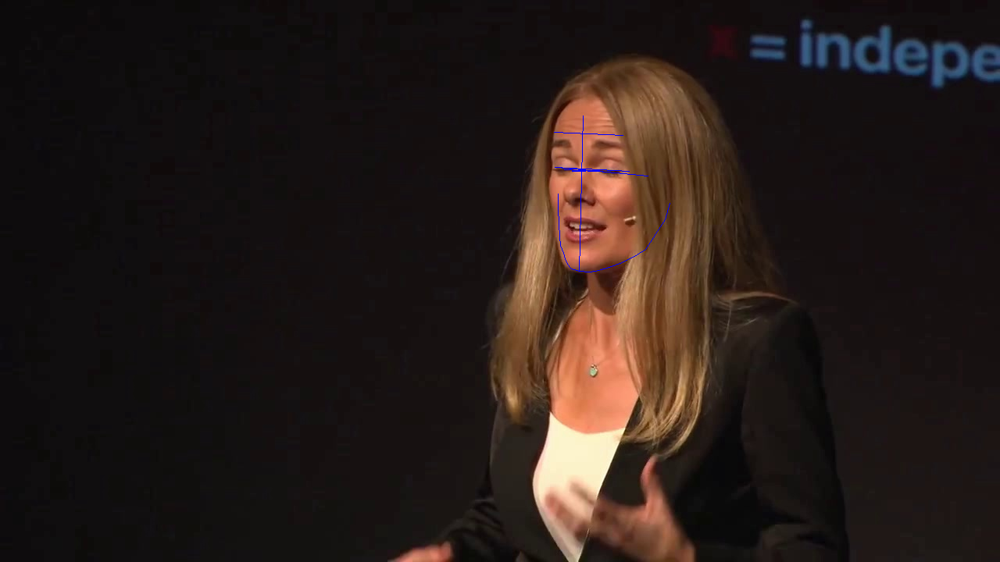

91.65164807613932


In [ ]:
import cv2
import mediapipe as mp

mp_face_mesh = mp.solutions.face_mesh
khanh=[]

with mp_face_mesh.FaceMesh(static_image_mode=True,max_num_faces=1,refine_landmarks=True,min_detection_confidence=0.5) as face_mesh:

    image = cv2.imread("40 images_2 data/cut frame from 20 vid/vid11_frame1.jpg")
    results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    w, h = image.shape[1], image.shape[0]
    face_landmarks = results.multi_face_landmarks

    #def function
    def take_landmark(num):
      results = [face_landmarks.landmark[num].x * w, face_landmarks.landmark[num].y * h,face_landmarks.landmark[num].z * w]
      return results

    def take_distance(num1,num2):
      distances = math.sqrt((face_landmarks.landmark[num1].x *w- face_landmarks.landmark[num2].x *w)**2 +(face_landmarks.landmark[num1].y *h- face_landmarks.landmark[num2].y*h)**2+(face_landmarks.landmark[num1].z*w- face_landmarks.landmark[num2].z*w)**2 )
      return distances

    def draw_line(num1,num2):
      color=(255, 0, 0)
      return cv2.line(image,(int(take_landmark(num1)[0]),int(take_landmark(num1)[1])),(int(take_landmark(num2)[0]),int(take_landmark(num2)[1])),color,1)

    if results.multi_face_landmarks is not None:
        for face_landmarks in results.multi_face_landmarks:
            khanh.append(face_landmarks)

    #Đường kính mắt: 474,476
    diameter_mm=11.2/take_distance(474,476)

    # Face Length: 152, 10
    facelength_distance = take_distance(152,10)*diameter_mm

    ## Iris: 473, 468
    pd_distance=take_distance(473,468)*diameter_mm

    ## FOREHEAD: 54, 333
    forehead_distance=take_distance(54,333)*diameter_mm

    # JAWLINE: 58, 433
    jawline_distance=take_distance(58,433)*diameter_mm

    # OUTER EYE: 130, 359
    outereye_distance=take_distance(130,359)*diameter_mm

    #INNER EYE: 112, 362
    innereye_distance=take_distance(112,363)*diameter_mm

    #CHEEKBONE: 227, 454
    cheekbone_distance1=take_distance(227,454)
    cheekbone_distance=take_distance(93,132)+take_distance(132,58)+take_distance(58,172)+take_distance(136,172)+take_distance(136,150)+take_distance(150,149)+take_distance(149,176)+take_distance(176,152)+take_distance(152,337)+take_distance(337,400)+take_distance(400,378)+take_distance(378,379)+take_distance(379,365)+take_distance(365,397)+take_distance(397,361)+take_distance(361,323)
    cheekbone_distance=cheekbone_distance*diameter_mm

    #TEMPLE WIDTH: 127, 372
    templewidth_distance=take_distance(127,372)

    for face_landmarks in results.multi_face_landmarks:
        #cv2.circle(annotated_image, ( int(forehead_left[0]),int(forehead_left[1]) ), 5, (255,255,0), -2)
        # draw LINE
        draw_line(152,10) ## Face Length: 152, 10
        draw_line(54,333) ## FOREHEAD: 54, 333
        draw_line(473,468) ## Iris: 473, 468
        draw_line(130,359) # OUTER EYE: 130, 359
        draw_line(112,362) #INNER EYE: 112, 362
        draw_line(127,372) #TEMPLE WIDTH: 127, 372
        # cheeck bone
        draw_line(93,132);draw_line(132,58);draw_line(58,172);draw_line(172,136);draw_line(136,150);draw_line(150,149);draw_line(149,176);draw_line(176,148);draw_line(148,152)
        draw_line(152,377);draw_line(377,400);draw_line(400,378);draw_line(378,379);draw_line(379,365);draw_line(365,397);draw_line(397,361);draw_line(361,323)

cv2_imshow( image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# 40 hình

['oval (145).jpg', 'square (824).jpg', 'square (159).jpg', 'heart (91).jpg', 'round (354).jpg', 'oval (288).jpg', 'round (428).jpg', 'square (486).jpg', 'oblong (280).jpg', 'square (15).jpg', 'heart (726).jpg', 'oblong (684).jpg', 'round (4).jpg', 'heart (446).jpg', 'oblong (8).jpg', 'oblong (315).jpg', 'round (425).jpg', 'oval (686).jpg', 'oval (292).jpg', 'heart (995).jpg', 'vid19_frame1.jpg', 'vid4_frame1.jpg', 'vid10_frame1.jpg', 'vid1_frame1.jpg', 'vid31_frame1.jpg', 'vid11_frame1.jpg', 'vid25_frame1.jpg', 'vid22_frame1.jpg', 'vid15_frame1.jpg', 'vid2_frame1.jpg', 'vid18_frame1.jpg', 'Vid3_frame1.jpg', 'vid27_frame1.jpg', 'vid20_frame1.jpg', 'vid17_frame1.jpg', 'vid13_frame1.jpg', 'vid16_frame1.jpg', 'vid9_frame1.jpg', 'vid28_frame1.jpg', 'vid7_frame1.jpg']


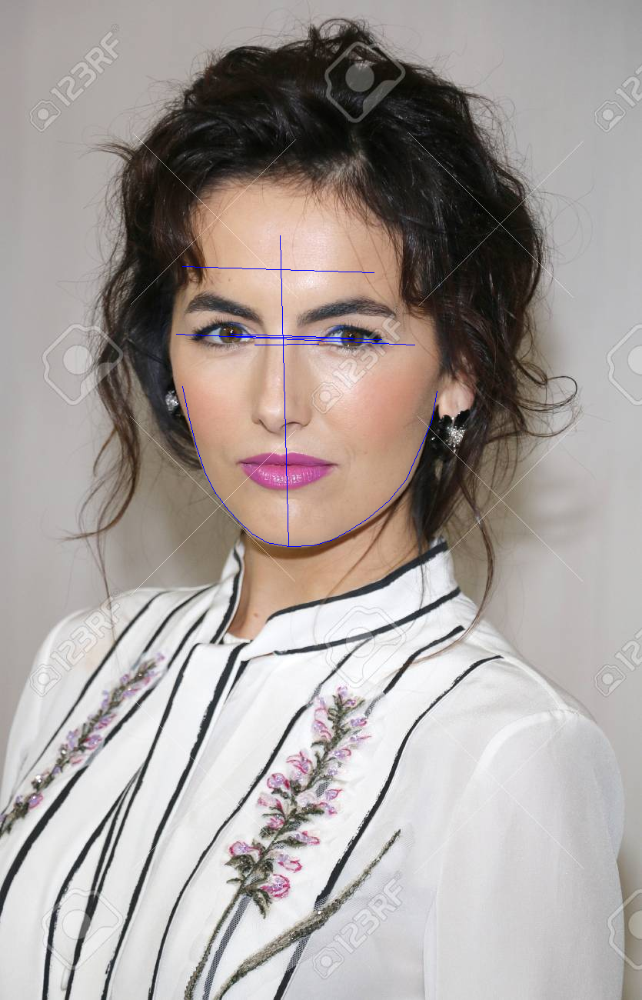

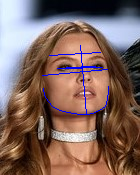

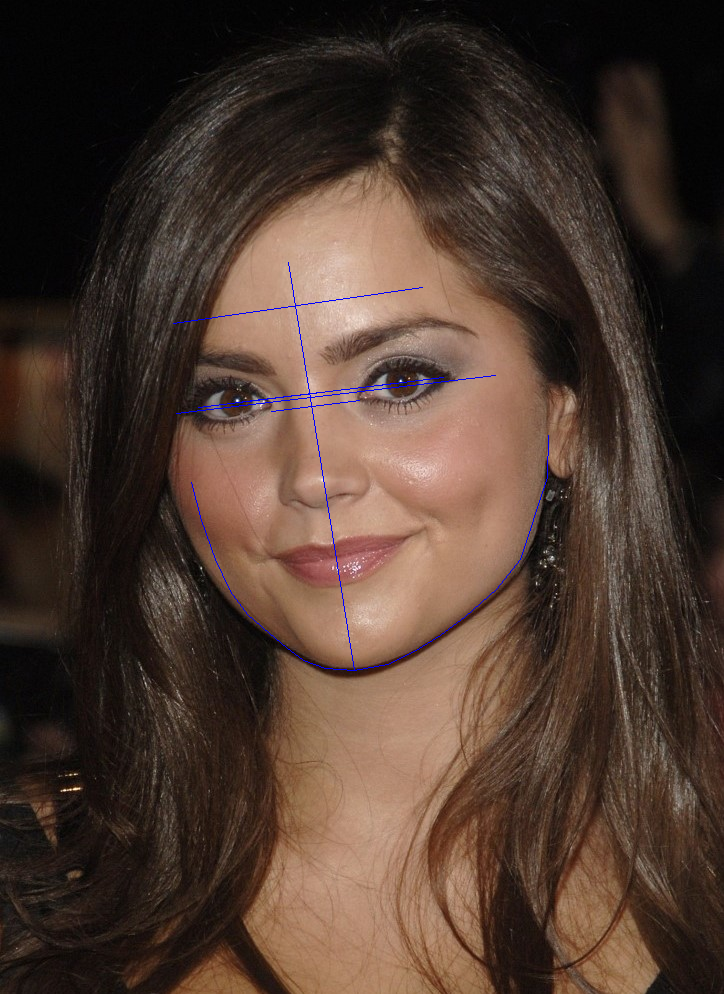

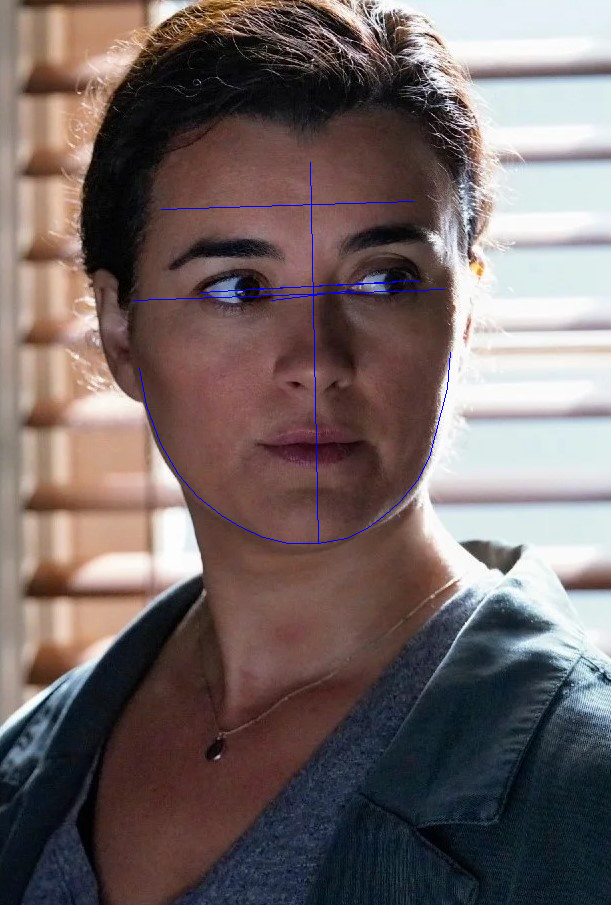

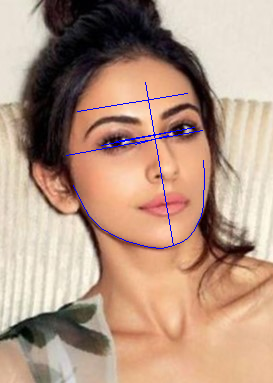

...

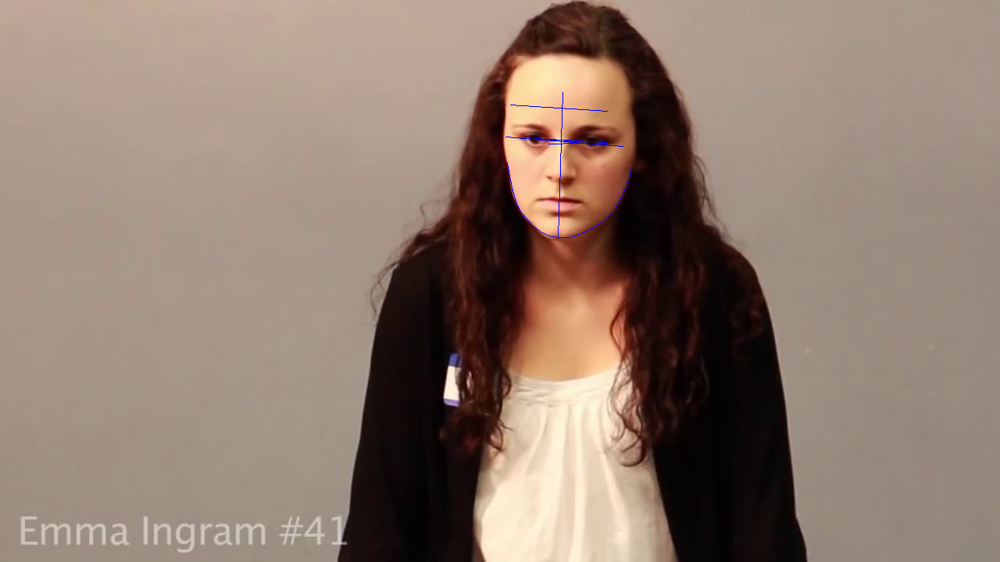

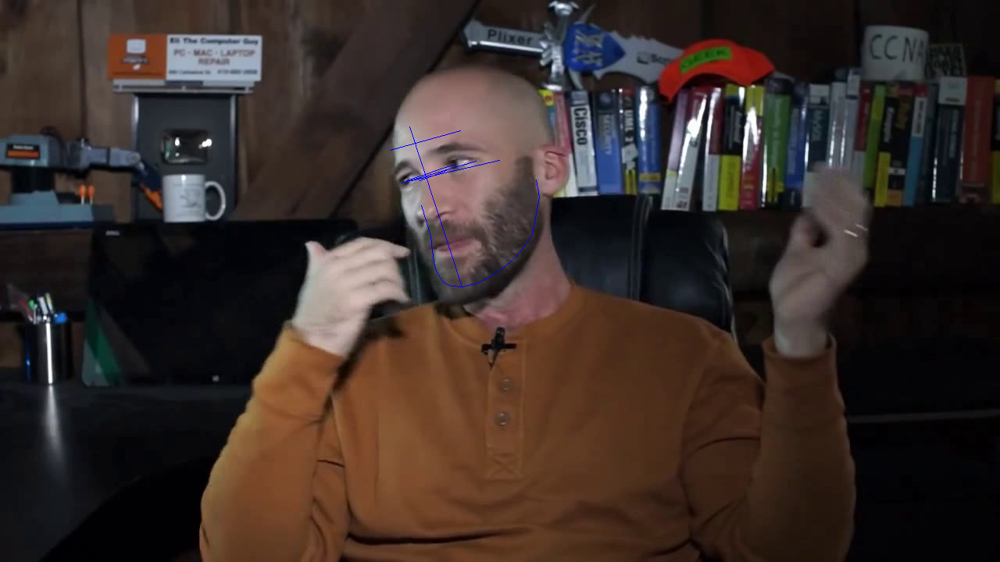

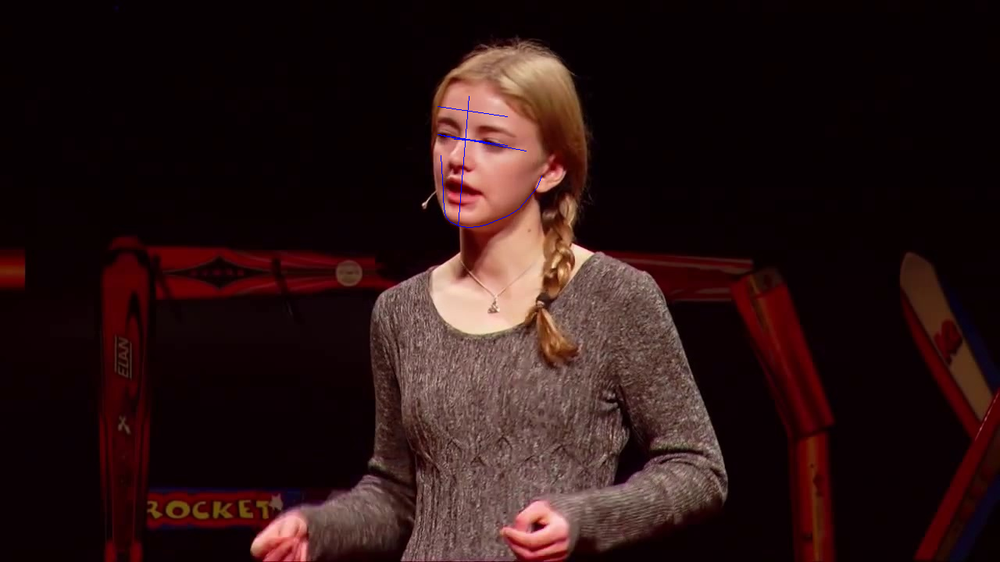

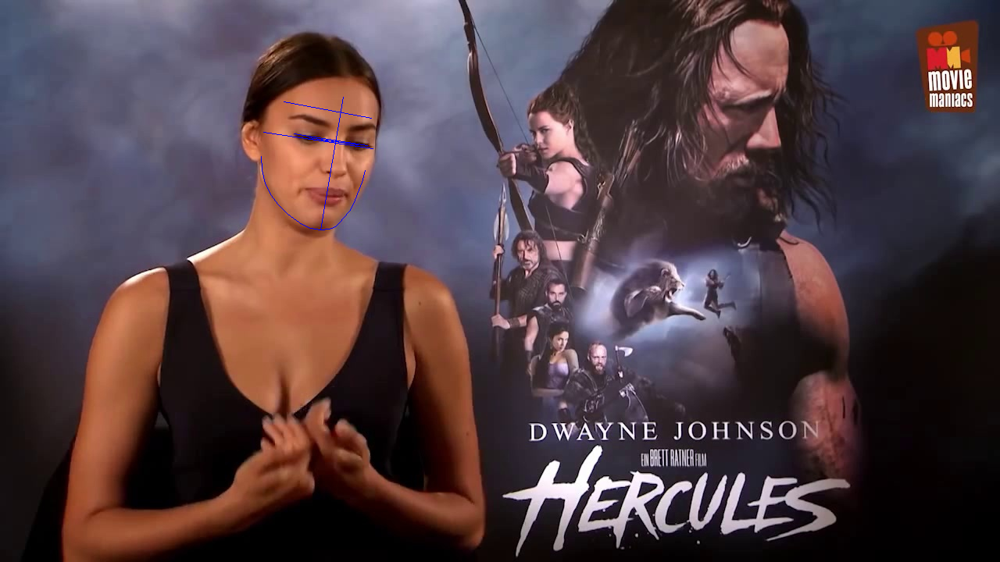

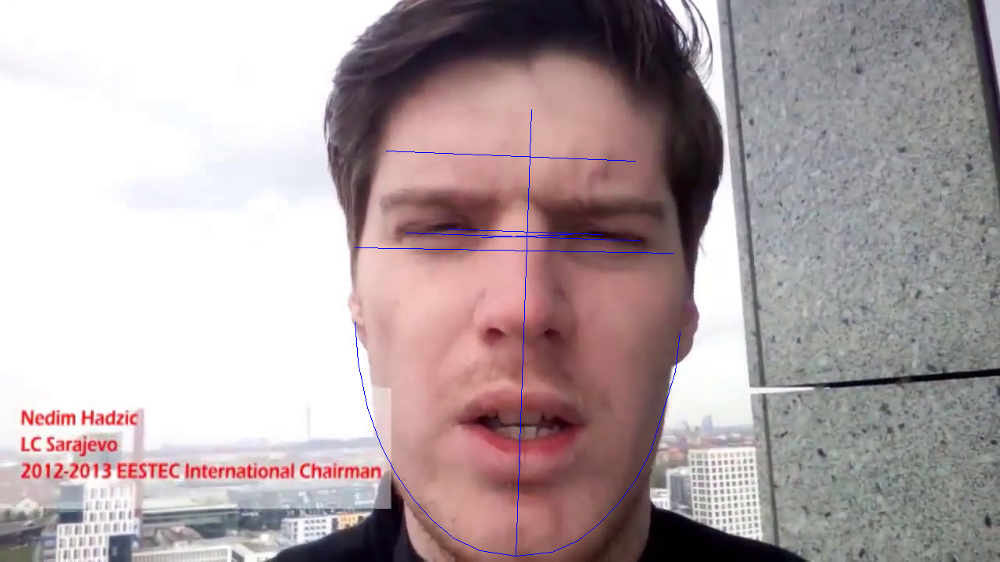

In [ ]:
#get filename:
import os
names = [os.path.basename(x) for x in glob.glob('40 images_2 data/*/*.jpg')]
print(names)

mp_face_mesh = mp.solutions.face_mesh

forehead_distances=[]; cheekbone_distances=[]; jawline_distances=[];facelength_distances =[]

images = glob.glob("40 images_2 data/*/*.jpg")
for image in images:
  image = cv2.imread(image, 1)
  width,height=image.shape[:2]

  with mp_face_mesh.FaceMesh(static_image_mode=True,max_num_faces=1,refine_landmarks=True,min_detection_confidence=0.5) as face_mesh:
      results = face_mesh.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      annotated_image = image.copy()
      w, h = annotated_image.shape[1], annotated_image.shape[0]
      khanh = []

      #def function
      def take_landmark(num):
        results = [face_landmarks.landmark[num].x * w, face_landmarks.landmark[num].y * h,face_landmarks.landmark[num].z * w]
        return results
      def take_distance(num1,num2):
        distances = math.sqrt((face_landmarks.landmark[num1].x *w- face_landmarks.landmark[num2].x *w)**2 +(face_landmarks.landmark[num1].y *h- face_landmarks.landmark[num2].y*h)**2+(face_landmarks.landmark[num1].z*w- face_landmarks.landmark[num2].z*w)**2 )
        return distances
      def draw_line(num1,num2):
        color=(255, 0, 0)
        return cv2.line(image,(int(take_landmark(num1)[0]),int(take_landmark(num1)[1])),(int(take_landmark(num2)[0]),int(take_landmark(num2)[1])),color,1)


      if results.multi_face_landmarks is not None:
          for face_landmarks in results.multi_face_landmarks:
              khanh.append(face_landmarks)
      # landmarks = khanh[0]

      # Face Length: 152, 10
      facelength_l = take_landmark(152)
      facelength_r = take_landmark(10)
      facelength_distance = take_distance(152,10)

      ## Iris: 473, 468
      iris_l= take_landmark(473)
      iris_r= take_landmark(468)
      pd_distance=take_distance(473,468)

      ## FOREHEAD: 54, 333
      forehead_l= take_landmark(54)
      forehead_r= take_landmark(333)
      forehead_distance=take_distance(54,333)

      #JAWLINE LENGTH: 58,172,136,150,149,176,148 & 152 & 377,400,378,379,368,397
      jawline_length=take_distance(93,132)+take_distance(132,58)+take_distance(58,172)+take_distance(136,172)+take_distance(136,150)+take_distance(150,149)+take_distance(149,176)+take_distance(176,152)+take_distance(152,337)+take_distance(337,400)+take_distance(400,378)+take_distance(378,379)+take_distance(379,365)+take_distance(365,397)+take_distance(397,361)+take_distance(361,323)


      # OUTER EYE: 130, 359
      outereye_l= take_landmark(130)
      outereye_r= take_landmark(359)
      outereye_distance=take_distance(130,359)

      #INNER EYE: 112, 362
      innereye_l= take_landmark(112)
      innereye_r= take_landmark(362)
      innereye_distance=take_distance(112,363)

      #CHEEKBONE: 227, 454
      cheekbone_l= take_landmark(227)
      cheekbone_r= take_landmark(454)
      cheekbone_distance=take_distance(227,454)
      cheekbone_distance=take_distance(93,132)+take_distance(132,58)+take_distance(58,172)+take_distance(136,172)+take_distance(136,150)+take_distance(150,149)+take_distance(149,176)+take_distance(176,152)+take_distance(152,337)+take_distance(337,400)+take_distance(400,378)+take_distance(378,379)+take_distance(379,365)+take_distance(365,397)+take_distance(397,361)+take_distance(361,323)

      #TEMPLE WIDTH: 127, 372
      templewidth_l= take_landmark(127)
      templewidth_r= take_landmark(372)
      templewidth_distance=take_distance(127,372)

      forehead_distances.append(forehead_distance); cheekbone_distances.append(cheekbone_distance)
      jawline_distances.append(jawline_distance);facelength_distances.append(facelength_distance)

      if results.multi_face_landmarks:
        for face_landmarks in results.multi_face_landmarks:
            #cv2.circle(annotated_image, ( int(forehead_left[0]),int(forehead_left[1]) ), 5, (255,255,0), -2)
            #draw LINE
            draw_line(152,10) ## Face Length: 152, 10
            draw_line(54,333) ## FOREHEAD: 54, 333
            draw_line(473,468) ## Iris: 473, 468
            draw_line(130,359) # OUTER EYE: 130, 359
            draw_line(112,362) #INNER EYE: 112, 362
            draw_line(127,372) #TEMPLE WIDTH: 127, 372
        # cheeck bone
            draw_line(93,132);draw_line(132,58);draw_line(58,172);draw_line(172,136);draw_line(136,150);draw_line(150,149);draw_line(149,176);draw_line(176,148);draw_line(148,152)
            draw_line(152,377);draw_line(377,400);draw_line(400,378);draw_line(378,379);draw_line(379,365);draw_line(365,397);draw_line(397,361);draw_line(361,323)


  cv2_imshow(image)
  cv2.waitKey(0)


In [ ]:
print('forehead',forehead_distances)
print('cheekbone',cheekbone_distances)
print('jawline',jawline_distances)
print('facelength',facelength_distances)
print(len(forehead_distances))
print(names)

forehead [200.65192642672366, 89.36890956056577, 278.30547520776486, 176.75350174083007, 115.00467785703158, 266.88905916008724, 123.33062706180462, 90.77041073629688, 164.40173734926046, 151.28214333403997, 51.11502636365072, 128.53045010936998, 208.89987366028595, 130.3240524286985, 130.30562812480858, 57.707044434650754, 261.2707816265378, 90.53203879666773, 112.15477760966661, 252.56549018755507, 91.45333284435692, 111.53966918688508, 130.54152907364661, 101.3789725245709, 110.6274402512827, 122.53565644682858, 65.99178518360883, 107.27907525608573, 114.94444722840862, 326.05316630794607, 135.00107617209986, 113.56051456762704, 111.90097160067054, 119.84167417803043, 252.42070411463192, 116.27657046306223, 98.26564029528494, 138.13643934862102, 176.16730550837417, 105.93886941996827]
cheekbone [260.11729040527194, 112.26415154425594, 378.08958852882074, 228.43872544486524, 147.62105124008286, 345.0937070089609, 159.61281223788896, 117.63879856537648, 214.4040030792232, 195.87199468

In [ ]:
df=pd.DataFrame('filename':names,
                'forehead':forehead_distances,
                'cheekbone':cheekbone_distances,
                'jawline':jawline_distances,
                'facelength':facelength_distances,
                'fforehea':forehead_distances
                )
df

SyntaxError: ignored

In [ ]:
# shape: 'Triangle'=1, 'Heart'=2, 'Oblong'=3, 'Round'=4, 'Diamond'=5, 'Oval'=6, 'Undifined'=7
def face_shape(forehead_distance, cheekbone_distance, jawline_distance, facelength_distance):
    if jawline_distance > cheekbone_distance and cheekbone_distance > forehead_distance:
      shape=1 # 'Triangle'
      print('Triangle')

    elif forehead_distance > cheekbone_distance:
        shape=2 # 'Heart'
        print('Heart')

    elif abs(forehead_distance-cheekbone_distance) <= 20 and abs(cheekbone_distance-jawline_distance)  <= 20 and facelength_distance > forehead_distance and facelength_distance > cheekbone_distance and facelength_distance > jawline_distance:
        shape=3
        print('Oblong')

    elif abs(cheekbone_distance-facelength_distance) <= 20 and cheekbone_distance > forehead_distance and cheekbone_distance > jawline_distance:
        shape=4
        print('Round') #Round

    elif facelength_distance > cheekbone_distance and cheekbone_distance > forehead_distance and forehead_distance > jawline_distance:
        shape=5
        print('Diamond') #Diamond

    elif facelength_distance > cheekbone_distance and forehead_distance > jawline_distance:
        shape=6
        print('Oval') #Oval

    else:
        shape=7
        print('Undifined') #"Undifined"

In [ ]:
for i in range(40):
  face_shape(forehead_distances[i], cheekbone_distances[i], jawline_distances[i], facelength_distances[i])

Undifined
Triangle
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Triangle
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
Undifined
